In [1]:
#Loading the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [2]:
#Loading the dataset
dataset = pd.read_csv("AIDA Week 13_Homework_Industry Data_Supervised Learning.csv")
dataset.head()

,Customer ID,Date of Default,Amount Default,Cumulative Payment till date,Gender,State,Bank,Default,Purchase Channel,Age,Insurance,Loan,Savings,FD,DMAT,Fraud,Card Type,City
0,546301568,24-08-2019,582993,420324.0,1,0,ICICI,1,3,59.0,1,663918,216348,0,1,N,0,Delhi
1,18658241,04-12-2020,760344,708671.0,1,0,SBI,1,1,59.0,1,107236,439609,1,0,N,0,Kolkata
2,545307255,30-10-2018,433971,835055.0,0,2,SBI,0,1,35.0,0,745659,415287,1,0,N,1,Delhi
3,685777392,14-04-2019,945476,759583.0,0,1,SBI,1,2,38.0,0,24216,284974,0,0,N,0,Mumbai
4,838154128,30-11-2020,874825,71394.0,1,2,SBI,1,3,50.0,0,794057,18748,1,1,N,1,Mumbai


In [3]:
#dropping the columns that are not required
X = dataset.drop(['Customer ID', 'Date of Default', 'Default'], axis=1)
y = dataset['Default'].values
y

array([1, 1, 0, ..., 0, 1, 0])

In [4]:
#cleaning the data
X = X.fillna(X.mode())
X = X.iloc[:].values
X

array([[582993, 420324.0, 1, ..., 'N', 0, 'Delhi'],
       [760344, 708671.0, 1, ..., 'N', 0, 'Kolkata'],
       [433971, 835055.0, 0, ..., 'N', 1, 'Delhi'],
       ...,
       [634376, 723328.0, 0, ..., 'N', 1, 'Mumbai'],
       [160692, 844678.0, 0, ..., 'N', 1, 'Mumbai'],
       [654997, 726110.0, 0, ..., 'N', 1, 'Kolkata']], dtype=object)

In [5]:
#encoding bank and city names
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
le = LabelEncoder()
X[:,4] = le.fit_transform(X[:,4])
X[:,12] = le.fit_transform(X[:,12])

X

array([[582993, 420324.0, 1, ..., 0, 0, 'Delhi'],
       [760344, 708671.0, 1, ..., 0, 0, 'Kolkata'],
       [433971, 835055.0, 0, ..., 0, 1, 'Delhi'],
       ...,
       [634376, 723328.0, 0, ..., 0, 1, 'Mumbai'],
       [160692, 844678.0, 0, ..., 0, 1, 'Mumbai'],
       [654997, 726110.0, 0, ..., 0, 1, 'Kolkata']], dtype=object)

In [6]:
from sklearn.compose import ColumnTransformer

ct = ColumnTransformer([('City', OneHotEncoder(), [14])], remainder='passthrough')
X = ct.fit_transform(X)
X

array([[0.0, 1.0, 0.0, ..., 1, 0, 0],
       [0.0, 0.0, 1.0, ..., 0, 0, 0],
       [0.0, 1.0, 0.0, ..., 0, 0, 1],
       ...,
       [0.0, 0.0, 0.0, ..., 1, 0, 1],
       [0.0, 0.0, 0.0, ..., 0, 0, 1],
       [0.0, 0.0, 1.0, ..., 0, 0, 1]], dtype=object)

In [7]:
#create dataframe
X = pd.DataFrame(X, columns = ['X1', 'X2', 'X3', 'X4','Amount Default', 'Cumulative Payment till date',	'Gender',	'State',	'Bank',	'Purchase Channel'	,'Age',	'Insurance'	,'Loan',	'Savings',	'FD'	,'DMAT'	,'Fraud',	'Card Type'])
X.head()

,X1,X2,X3,X4,Amount Default,Cumulative Payment till date,Gender,State,Bank,Purchase Channel,Age,Insurance,Loan,Savings,FD,DMAT,Fraud,Card Type
0,0.0,1.0,0.0,0.0,582993,420324.0,1,0,1,3,59.0,1,663918,216348,0,1,0,0
1,0.0,0.0,1.0,0.0,760344,708671.0,1,0,2,1,59.0,1,107236,439609,1,0,0,0
2,0.0,1.0,0.0,0.0,433971,835055.0,0,2,2,1,35.0,0,745659,415287,1,0,0,1
3,0.0,0.0,0.0,1.0,945476,759583.0,0,1,2,2,38.0,0,24216,284974,0,0,0,0
4,0.0,0.0,0.0,1.0,874825,71394.0,1,2,2,3,50.0,0,794057,18748,1,1,0,1


In [8]:
#dropping NA values
dataset = dataset.dropna()
Y = dataset['Default']
x = X.dropna()

import statsmodels.api as sm
# Add a constant to get an intercept
x = sm.add_constant(x)
model = sm.OLS(Y, x.astype(float)).fit()
model.summary()

#checking for the valid variables

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/usr/local/lib/python3.8/dist-packages/statsmodels/regression/linear_model.py:1860: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(eigvals[0]/eigvals[-1])


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Default   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8665
Date:                Sat, 17 Dec 2022   Prob (F-statistic):              0.609
Time:                        21:08:50   Log-Likelihood:                -7249.4
No. Observations:                9998   AIC:                         1.453e+04
Df Residuals:                    9981   BIC:                         1.466e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                            0.4045      0.027     15.107      0.000       0.352       0.457
X1                               0.1175      0.011     10.724      0.000       0.096       0.139
X2                               0.0989      0.011      8.988      0.000       0.077       0.121
X3                               0.0871      0.011      7.964      0.000       0.066       0.109
X4                               0.1010      0.011      9.258      0.000       0.080       0.122
Amount Default                1.611e-08   1.73e-08      0.934      0.351   -1.77e-08    4.99e-08
Cumulative Payment till date -1.264e-08   1.75e-08     -0.721      0.471    -4.7e-08    2.17e-08
Gender                          -0.0080      0.010     -0.800      0.424      -0.028       0.012
State                           -0.0043      0.006     -0.698      0.485      -0.016       0.008
Bank                         -3.784e-05      0.006     -0.006      0.995      -0.012       0.012
Purchase Channel                -0.0039      0.006     -0.638      0.524      -0.016       0.008
Age                              0.0006      0.000      1.259      0.208      -0.000       0.001
Insurance                       -0.0134      0.010     -1.336      0.182      -0.033       0.006
Loan                         -2.711e-08   1.74e-08     -1.563      0.118   -6.11e-08     6.9e-09
Savings                       2.418e-09   1.73e-08      0.140      0.889   -3.15e-08    3.64e-08
FD                               0.0027      0.010      0.265      0.791      -0.017       0.022
DMAT                             0.0003      0.010      0.034      0.973      -0.019       0.020
Fraud                                 0          0        nan        nan           0           0
Card Type                       -0.0050      0.010     -0.504      0.615      -0.025       0.015
==============================================================================
Omnibus:                    34501.686   Durbin-Watson:                   1.964
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1657.104
Skew:                           0.008   Prob(JB):                         0.00
Kurtosis:                       1.006   Cond. No.                          inf
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is      0. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [9]:
#Splitting the dataset into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

#standardizing the data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_train

array([[-0.58004459, -0.58562605, -0.57080675, ..., -1.00601811,
         0.        , -1.02352668],
       [-0.58004459, -0.58562605,  1.75190639, ..., -1.00601811,
         0.        , -1.02352668],
       [-0.58004459, -0.58562605, -0.57080675, ..., -1.00601811,
         0.        , -1.02352668],
       ...,
       [-0.58004459, -0.58562605,  1.75190639, ...,  0.99401789,
         0.        , -1.02352668],
       [ 1.72400541, -0.58562605, -0.57080675, ..., -1.00601811,
         0.        , -1.02352668],
       [-0.58004459,  1.70757433, -0.57080675, ...,  0.99401789,
         0.        ,  0.9770141 ]])

In [10]:
#dealing with NaN values in the dataset by estimating the missing values using multivariate feature imputation
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit(X_train)
X_train = imp.transform(X_train)
X_test = imp.transform(X_test)

In [11]:
#Training the model
clf = DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.4795


In [12]:
!pip install six

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [13]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('tree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.353699 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.353699 to fit



Accuracy: 0.4795
[[474 524]
 [517 485]]


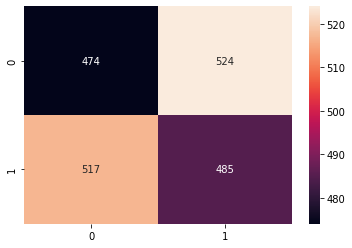

In [14]:
import seaborn as sns
import sklearn.metrics as metrics

y_pred = clf.predict(X_test)
y_pred = y_pred>0.5

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

from sklearn.metrics import confusion_matrix
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

sns.heatmap(cm, annot = True, fmt = '')